In [1]:
# type: ignore
from typing import Union, List, Text
from pprint import pprint
import random
import uuid

from diffusers import AutoPipelineForInpainting, ControlNetModel, StableDiffusionControlNetInpaintPipeline, AutoencoderKL
from diffusers.utils import load_image, make_image_grid, numpy_to_pil
import torch
import torch.nn as nn
import torchvision.transforms as T
import numpy as np
import PIL
from PIL import Image, ImageShow, ImageFilter
from transformers import SegformerImageProcessor, AutoModelForSemanticSegmentation
import requests
import matplotlib.pyplot as plt
import cv2
from IPython.core.debugger import Pdb
from controlnet_aux import OpenposeDetector
import numpy as np
from ip_adapter import IPAdapter, IPAdapterPlus, IPAdapterFull

from src.conf import get_project_root

/workspace/playground/dev-venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/workspace/playground/dev-venv/lib/python3.10/site-packages/diffusers/models/vq_model.py:20: FutureWarning: `VQEncoderOutput` is deprecated and will be removed in version 0.31. Importing `VQEncoderOutput` from `diffusers.models.vq_model` is deprecated and this will be removed in a future version. Please use `from diffusers.models.autoencoders.vq_model import VQEncoderOutput`, instead.
  deprecate("VQEncoderOutput", "0.31", deprecation_message)
/workspace/playground/dev-venv/lib/python3.10/site-packages/diffusers/models/vq_model.py:25: FutureWarning: `VQModel` is deprecated and will be removed in version 0.31. Importing `VQModel` from `diffusers.models.vq_model` is deprecated and this will be removed in a future version. Pleas

In [2]:
project_root_path = get_project_root()

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
# Utilities
def show(image: Union[str, PIL.Image.Image], downsize_ratio: int = 1):
    if isinstance(image, PIL.Image.Image):
        pass
    else:
        image = Image.open(img_path)
    viewer = ImageShow.IPythonViewer()
    width = image.width // downsize_ratio
    height = image.height // downsize_ratio
    resized_img = image.resize((width, height))
    viewer.show(image=resized_img)

# Reference: 
# https://github.com/huggingface/diffusers/issues/3514#issuecomment-1565221994
# https://github.com/Markus-Pobitzer/Inpainting-Tutorial/tree/main
def mask_dilation(mask, kernel_size=10):
    mask = mask.astype(np.uint8)
    mask = cv2.dilate(
        mask,
        np.ones((kernel_size, kernel_size), np.uint8),
        iterations=1
    )
    return mask

def blend_images(img1, img2, mask, blur=3, dilate=0):
    if dilate:
        mask = numpy_to_pil(mask_dilation(np.array(mask) // 255, dilate) * 255)[0]
    mask = mask.convert('L').filter(ImageFilter.GaussianBlur(blur))
    img1 = img1.convert('RGBA')
    img2 = img2.convert('RGBA')
    blended_img = Image.composite(img1, img2, mask)
    return blended_img

In [5]:
""" 
Load ControlNet for Human Pose
"""
controlnet = ControlNetModel.from_pretrained(
    'lllyasviel/sd-controlnet-openpose',
    torch_dtype=torch.float16
)

In [6]:
""" Load VAE
"""
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float16)

In [7]:
""" 
Load SD Inpaiting Pipeline
"""
inpainting_base_model = 'runwayml/stable-diffusion-inpainting'
pipeline = StableDiffusionControlNetInpaintPipeline.from_pretrained(
    inpainting_base_model,
    vae=vae,
    torch_dtype=torch.float16,
    controlnet=controlnet,
    feature_extractor=None,
    safety_checker=None
).to('cuda')

text_encoder/model.safetensors not found
Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]An error occurred while trying to fetch /home/ubuntu/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/51388a731f57604945fddd703ecb5c50e8e7b49d/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ubuntu/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/51388a731f57604945fddd703ecb5c50e8e7b49d/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/workspace/playground/dev-venv/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner

In [8]:
# """
# Load IP-Adapter Inpainting pipeline
# """
# pipeline.load_ip_adapter(
#     'h94/IP-Adapter',
#     subfolder='models',
#     weight_name='ip-adapter_sd15.bin'
# )
# pipeline.set_ip_adapter_scale(1.0)

In [9]:
# """
# Load LoRA weights
# """
# pipeline.load_lora_weights(
#     '../models/finetune/dreambooth_w_lora/coolmate/1/',
#     weight_name='pytorch_lora_weights.safetensors'
# )

In [10]:
class Masker:
    def __init__(self, model_id='mattmdjaga/segformer_b2_clothes'): # SegFormer
        self.processor = SegformerImageProcessor.from_pretrained(model_id)
        self.model = AutoModelForSemanticSegmentation.from_pretrained(model_id)

    def get_binary_mask(self, image, return_pil=False):
        inputs = self.processor(images=image, return_tensors="pt")        
        outputs = self.model(**inputs)
        logits = outputs.logits.cpu()
        upsampled_logits = nn.functional.interpolate(
            logits,
            size=image.size[::-1],
            mode="bilinear",
            align_corners=False
        )
        pred_seg = upsampled_logits.argmax(dim=1)[0] # Dunno how this line work
        np_image = np.array(image)
        np_image[pred_seg != 4] = 0
        np_image[pred_seg == 4] = 255
        binary_mask = ((pred_seg == 4) * 255).numpy().astype(np.uint8)

        return Image.fromarray(binary_mask) if return_pil else binary_mask

In [11]:
masker = Masker()

/workspace/playground/dev-venv/lib/python3.10/site-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


In [12]:
""" Pose Detector """
openpose = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')

In [13]:
def try_on(original_image: PIL.Image.Image, 
           mask_image: PIL.Image.Image,
           ip_image: Union[PIL.Image.Image] = None,
           prompt: Text = "",
           control_image: Union[PIL.Image.Image] = None,
           **kwargs) -> List[PIL.Image.Image]:
    images = pipeline(
        prompt=prompt,
        negative_prompt=kwargs.get('negative_prompt'),
        image=original_image,
        mask_image=mask_image,
        control_image=control_image,
        guidance_scale=kwargs.get('guidance_scale'),
        width=kwargs.get('width'), # output width
        height=kwargs.get('height'), # output height
        ip_adapter_image=ip_image,
        generator=kwargs.get('seed'),
        num_images_per_prompt=kwargs.get('num_images'),
        strength=kwargs.get('strength'),
        num_inference_steps=kwargs.get('num_inference_steps'),
        padding_mask_crop=kwargs.get('padding_mask_crop'),
        ip_adapter_image_embeds=kwargs.get('ip_adapter_image_embeds'),
    ).images

    return images

In [14]:
negative_prompt = '3d, cartoon, anime, sketches, (worst quality, bad quality, cropped:1.4) ((monochrome) ), \
((grayscale) ), (bad-hands-5:1) , (badhandv4) , (easynegative:0.8) , (bad-artist-anime:) , (bad-artist:) , (bad_prompt:) , \
(bad-picture-chill-75v:) , (bad_prompt_version2:) , (bad_quality:) , Asian-Less-Neg bad-hands-5 bad_pictures \
bad artist -neg CyberRealistic_Negative-neg negative_hand-neg ng_deepnegative_v1_75t, verybadimagenegative_v1. 3, lowres, \
low quality, jpeg, artifacts, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, \
poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, \
gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, \
drawing, painting, crayon, sketch, graphite, impressionist, noisy, soft'

INPUT_IMAGE_SIZE = (512, 768) # just follow by IP-Adapter example (https://github.com/tencent-ailab/IP-Adapter?tab=readme-ov-file#sd_15)
# SQUARE_IMAGE_SIZE = (224, 224)

#### Pipeline Config

In [15]:
""" PIPELINE CONFIG
"""
pipe_config = {
    'negative_prompt': negative_prompt,
    'guidance_scale': 7.5,
    'num_images': 3,
    'strength': 1,
    'num_inference_steps': 35,
    'seed': torch.Generator(device="cuda").manual_seed(1337),
    'width': INPUT_IMAGE_SIZE[0],
    'height': INPUT_IMAGE_SIZE[1],
    'padding_mask_crop': None,
}

In [15]:
image = load_image('../images/male_model.jpg')
ip_image = load_image('../tmp/img4.jpg')
mask_image = masker.get_binary_mask(image, return_pil=True)

assert isinstance(image, PIL.Image.Image)
assert isinstance(ip_image, PIL.Image.Image)
assert isinstance(mask_image, PIL.Image.Image)

In [16]:
image = image.resize(INPUT_IMAGE_SIZE)
mask_image = mask_image.resize(INPUT_IMAGE_SIZE)
# ip_image = ip_image.resize(SQUARE_IMAGE_SIZE)

In [ ]:
""" SHOW INPUT IMAGES """
make_image_grid([ip_image.resize(INPUT_IMAGE_SIZE), image, mask_image], rows=1, cols=3)

#### IP-Adapter Only

In [ ]:
images = try_on(image, mask_image, ip_image, prompt="", **pipe_config)

In [ ]:
make_image_grid([image] + images, rows=1, cols=num_images + 1)

#### Ip-Adapter + Image Blending (*for face preserving*)

In [ ]:
# Blending the original image with the inpainted on based on the mask
# Restore the original unmasked area changed due to VAE process loss the original image
blended_images = [blend_images(inpainted_img, image, mask_image, dilate=0) for inpainted_img in images]
make_image_grid([image] + blended_images, rows=1, cols=num_images + 1)

##### Get Pose

In [ ]:
pose = openpose(image)
make_image_grid([image, pose], rows=1, cols=2)

#### Ip-Adapter + ControlNet (pose)

In [ ]:
# w/ ControlNet (Pose)
images = try_on(image, mask_image, ip_image, prompt="a sks black polo neck t-shirt", control_image=pose, **pipe_config)

In [ ]:
make_image_grid([image] + images, rows=1, cols=pipe_config['num_images'] + 1)

#### Ip-Adapter + ControlNet (pose) + Image Blending

In [ ]:
# Please run the very previous cell before doing with this one
blended_images = [blend_images(inpainted_img, image, mask_image, dilate=0) for inpainted_img in images]
make_image_grid([image] + blended_images, rows=1, cols=pipe_config['num_images'] + 1)

#### Ip-Adapter + ControlNet (pose) + padding_mask_crop

In [ ]:
# w/ padding_mask_crop + human pose controlnet
images = try_on(
    image, mask_image, ip_image,
    prompt="",
    control_image=pose,
    use_controlnet=True,
    **pipe_config
)

In [ ]:
make_image_grid([image] + images, rows=1, cols=pipe_config['num_images'] + 1)

#### Load Images

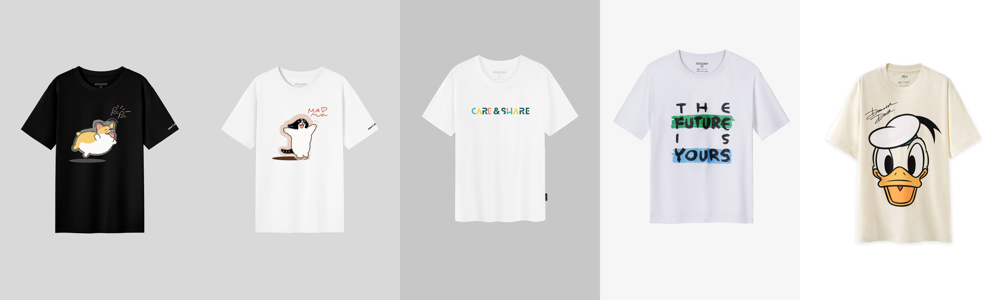

In [16]:
images = [
    'chubby_corgi_pappa-1.jpg',
    'cat_mama-2.jpg',
    'Ao_thun_cotton_in_Care_Share_moi-9.jpg',
    'Oversize_Clean_Vietnam.jpg',
    'donald-update_94.jpg'
]

# Load garment images
garments_dir = project_root_path/'images'/'garments'
garments_path = [str(garments_dir/fname) for fname in images]
g_images = [load_image(img) for img in garments_path]

# g_images = [load_image('/workspace/playground/downloads/VITON-HD/test/cloth/00127_00.jpg')]

# Show up
make_image_grid(g_images, rows=1, cols=len(g_images))

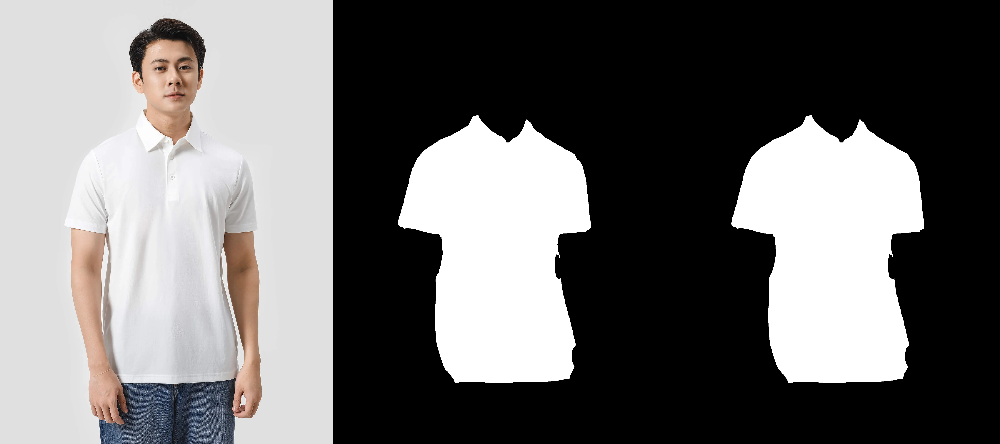

In [17]:
# Load person image
person_dir = project_root_path/'images'/'models'
person_path = str(person_dir/'APL.EC.T.2_18.jpg')
p_image = load_image(person_path)

# and get mask
mask = masker.get_binary_mask(p_image, return_pil=True)

# Show up
make_image_grid([p_image, mask, mask], rows=1, cols=3)

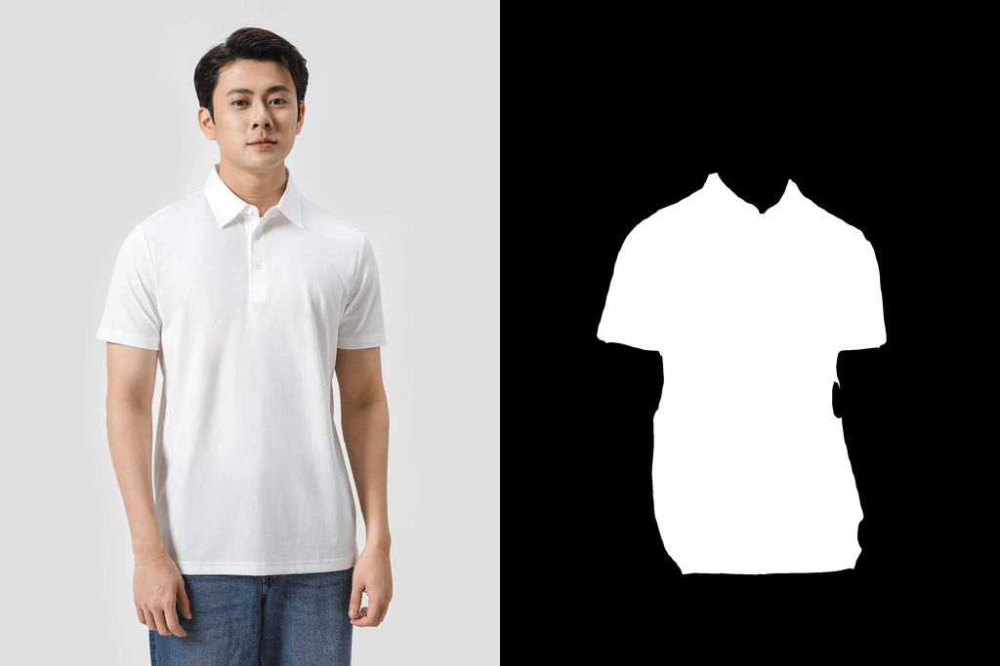

In [18]:
# Resize with preserving ratio
# https://stackoverflow.com/questions/273946/how-do-i-resize-an-image-using-pil-and-maintain-its-aspect-ratio
p_image.thumbnail(INPUT_IMAGE_SIZE, PIL.Image.Resampling.LANCZOS)
mask.thumbnail(INPUT_IMAGE_SIZE, PIL.Image.Resampling.LANCZOS)

make_image_grid([p_image, mask], rows=1, cols=2)

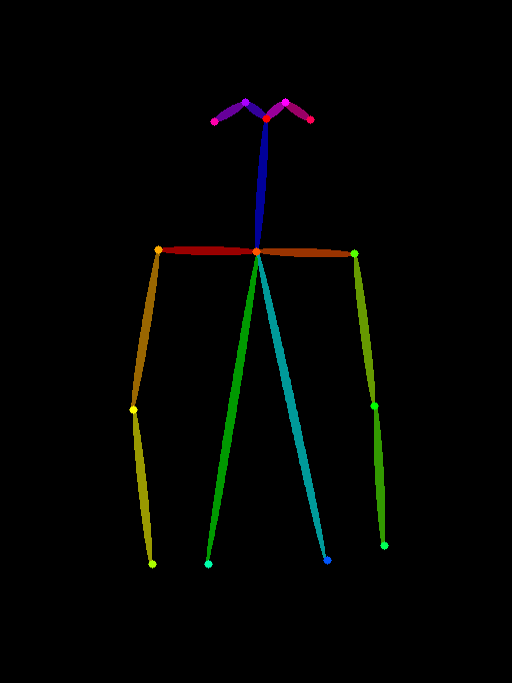

In [19]:
pose = openpose(p_image).resize(p_image.size)
pose

#### Guidance scale comparison

In [20]:
# guidance_scales = np.arange(1, 9).astype(float)
# images = []
# for gs in guidance_scales:
#     pipe_config.update({
#         'guidance_scale': gs,
#         'seed': torch.Generator(device="cuda").manual_seed(1337)
#     })
#     img = try_on(
#         p_image.resize(INPUT_IMAGE_SIZE),
#         mask.resize(INPUT_IMAGE_SIZE),
#         g_images[0],
#         prompt="",
#         control_image=pose,
#         **pipe_config
#     )[0]
#     images.append(img)

# make_image_grid(images, rows=1, cols=len(images))

#### IP-Adapter Tencent (CLIP - original vs finetuned)

In [20]:
# Use fine-grained features of CLIP
image_encoder_path = str(project_root_path/'opensources'/'IP-Adapter'/'models'/'image_encoder/')
ip_ckpt = str(project_root_path/'opensources'/'IP-Adapter'/'models'/'ip-adapter-plus_sd15.bin')
# my_ip_ckpt = '/workspace/playground/opensources/IP-Adapter/models/cloth_ip_adapter/resampler/clip/checkpoint-90000/ip_adapter.bin'
my_ip_ckpt = '/workspace/playground/IP-Adapter-finetuned-VITONHD/checkpoint-25000-bs16/ip_adapter.bin'

my_ip_model = IPAdapterPlus(
    sd_pipe=pipeline,
    image_encoder_path=image_encoder_path,
    ip_ckpt=my_ip_ckpt,
    device=device,
    num_tokens=16
)

ip_model = IPAdapterPlus(
    sd_pipe=pipeline,
    image_encoder_path=image_encoder_path,
    ip_ckpt=ip_ckpt,
    device=device,
    num_tokens=16
)

100%|██████████| 30/30 [00:08<00:00,  3.36it/s]


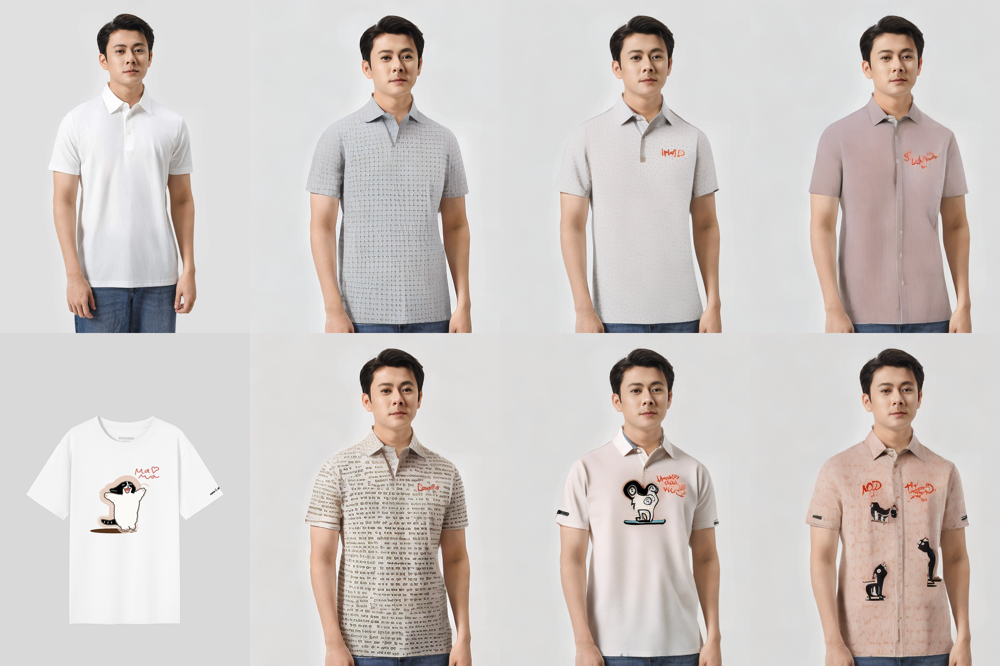

In [28]:
seed = random.randrange(1, 2030)
img_idx = 1
prompt = ''

images = ip_model.generate(
    pil_image=g_images[img_idx], # IP-Adatper image
    prompt=prompt,
    image=p_image,
    mask_image=mask,
    control_image=pose,
    num_samples=3,
    num_inference_steps=30,
    seed=seed,
    strength=1.,
    scale=1.,
)

my_images = my_ip_model.generate(
    pil_image=g_images[img_idx], # IP-Adatper image
    prompt=prompt,
    image=p_image,
    mask_image=mask,
    control_image=pose,
    num_samples=3,
    num_inference_steps=30,
    seed=seed,
    strength=1.,
    scale=1.,
)

ref_image = g_images[img_idx].copy()
ref_person = p_image.copy()
ref_image.thumbnail(images[0].size, PIL.Image.Resampling.LANCZOS)
ref_person.thumbnail(ref_image.size, PIL.Image.Resampling.LANCZOS)
output = make_image_grid([ref_person, *images, ref_image, *my_images], rows=2, cols=4)
display(output)

save = True
if save:
    fname = uuid.uuid4().hex[:6]
    output.save(project_root_path / 'tmp' / 'vitonhd_test' / f'{fname}.jpg')

#### IP-Adapter Tencent (CLIP - finetuning comparison)

In [20]:
# Use fine-grained features of CLIP
image_encoder_path = str(project_root_path/'opensources'/'IP-Adapter'/'models'/'image_encoder/')
ip_ckpt1 = '/workspace/playground/opensources/IP-Adapter/models/cloth_ip_adapter/resampler/clip/checkpoint-30000/ip_adapter.bin'
ip_ckpt2 = '/workspace/playground/IP-Adapter-finetuned-VITONHD/checkpoint-25000-bs16/ip_adapter.bin'

model1 = IPAdapterPlus(
    sd_pipe=pipeline,
    image_encoder_path=image_encoder_path,
    ip_ckpt=ip_ckpt1,
    device=device,
    num_tokens=16
)

model2 = IPAdapterPlus(
    sd_pipe=pipeline,
    image_encoder_path=image_encoder_path,
    ip_ckpt=ip_ckpt2,
    device=device,
    num_tokens=16
)

100%|██████████| 25/25 [00:07<00:00,  3.36it/s]


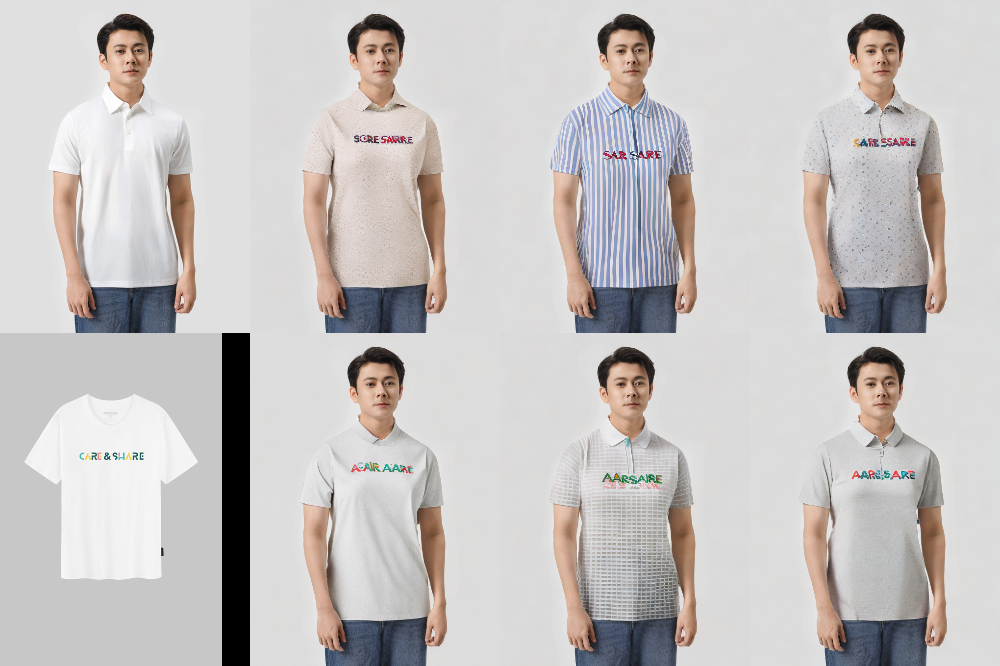

In [23]:
seed = random.randrange(1, 2024)
img_idx = 2
prompt = ''

img1 = model1.generate(
    pil_image=g_images[img_idx], # IP-Adatper image
    prompt=prompt,
    image=p_image,
    mask_image=mask,
    control_image=pose,
    num_samples=3,
    num_inference_steps=25,
    seed=seed,
    strength=1.,
    scale=1.,
)

img2 = model2.generate(
    pil_image=g_images[img_idx], # IP-Adatper image
    prompt=prompt,
    image=p_image,
    mask_image=mask,
    control_image=pose,
    num_samples=3,
    num_inference_steps=25,
    seed=seed,
    strength=1.,
    scale=1.,
)

ref_image = g_images[img_idx].copy()
ref_person = p_image.copy()
ref_image.thumbnail(img1[0].size, PIL.Image.Resampling.LANCZOS)
ref_person.thumbnail(img1[0].size, PIL.Image.Resampling.LANCZOS)
output = make_image_grid([ref_person, *img1, ref_image, *img2], rows=2, cols=4)
display(output)

save = True
if save:
    fname = uuid.uuid4().hex[:6]
    output.save(project_root_path / 'tmp' / 'vitonhd_test' / f'{fname}.jpg')

#### IP-Adapter Tencent (DINOv2)

In [24]:
"""
Instead of using clip for image encoder we use dinov2 because of its
powerful capability on various downstream tasks as well as general feature extraction.
"""
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load model
dinov2 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2.to(device)

Using cache found in /home/ubuntu/.cache/torch/hub/facebookresearch_dinov2_main
/home/ubuntu/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:43: UserWarning: xFormers is available (SwiGLU)
  warnings.warn("xFormers is available (SwiGLU)")
/home/ubuntu/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:27: UserWarning: xFormers is available (Attention)
  warnings.warn("xFormers is available (Attention)")
/home/ubuntu/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:33: UserWarning: xFormers is available (Block)
  warnings.warn("xFormers is available (Block)")


DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-23): 24 x NestedTensorBlock(
      (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=1024, out_features=3072, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=1024, out_features=1024, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=1024, out_features=4096, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=4096, out_features=1024, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )


In [25]:
# DINO image preprocessor
IMAGENET_DEFAULT_MEAN = (0.485, 0.456, 0.406)
IMAGENET_DEFAULT_STD = (0.229, 0.224, 0.225)
transform = T.Compose([
    T.Resize(224),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_DEFAULT_MEAN, std=IMAGENET_DEFAULT_STD),
])

def get_dinov2_embedding(x: PIL.Image.Image, model, device='cuda') -> torch.Tensor:
    transformed_x = transform(x)[:3].unsqueeze(0)
    with torch.inference_mode():
        return model(transformed_x.to(device))[0].to(torch.float16)

In [26]:
image_embedding = get_dinov2_embedding(g_images[0], dinov2)

In [27]:
ip_ckpt = str(project_root_path/'downloads'/'ip-adapter'/'models'/'ip-adapter-plus_sd15.bin')
image_encoder_path = str(project_root_path/'downloads'/'ip-adapter'/'models'/'image_encoder/')

ip_model = IPAdapterPlus(
    sd_pipe=pipeline,
    image_encoder_path=image_encoder_path,
    ip_ckpt=ip_ckpt,
    device=device,
    num_tokens=16,
)

/workspace/playground/dev-venv/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


RuntimeError: Error(s) in loading state_dict for Resampler:
	size mismatch for latents: copying a param with shape torch.Size([1, 16, 768]) from checkpoint, the shape in current model is torch.Size([1, 16, 1024]).
	size mismatch for proj_in.weight: copying a param with shape torch.Size([768, 1280]) from checkpoint, the shape in current model is torch.Size([1024, 1280]).
	size mismatch for proj_in.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for proj_out.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for proj_out.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for norm_out.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for norm_out.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.0.norm1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.0.norm1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.0.norm2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.0.norm2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.0.to_q.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([768, 1024]).
	size mismatch for layers.0.0.to_kv.weight: copying a param with shape torch.Size([1536, 768]) from checkpoint, the shape in current model is torch.Size([1536, 1024]).
	size mismatch for layers.0.0.to_out.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 768]).
	size mismatch for layers.0.1.0.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.1.0.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.0.1.1.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for layers.0.1.3.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for layers.1.0.norm1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.1.0.norm1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.1.0.norm2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.1.0.norm2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.1.0.to_q.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([768, 1024]).
	size mismatch for layers.1.0.to_kv.weight: copying a param with shape torch.Size([1536, 768]) from checkpoint, the shape in current model is torch.Size([1536, 1024]).
	size mismatch for layers.1.0.to_out.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 768]).
	size mismatch for layers.1.1.0.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.1.1.0.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.1.1.1.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for layers.1.1.3.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for layers.2.0.norm1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.2.0.norm1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.2.0.norm2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.2.0.norm2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.2.0.to_q.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([768, 1024]).
	size mismatch for layers.2.0.to_kv.weight: copying a param with shape torch.Size([1536, 768]) from checkpoint, the shape in current model is torch.Size([1536, 1024]).
	size mismatch for layers.2.0.to_out.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 768]).
	size mismatch for layers.2.1.0.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.2.1.0.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.2.1.1.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for layers.2.1.3.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for layers.3.0.norm1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.3.0.norm1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.3.0.norm2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.3.0.norm2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.3.0.to_q.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([768, 1024]).
	size mismatch for layers.3.0.to_kv.weight: copying a param with shape torch.Size([1536, 768]) from checkpoint, the shape in current model is torch.Size([1536, 1024]).
	size mismatch for layers.3.0.to_out.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 768]).
	size mismatch for layers.3.1.0.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.3.1.0.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for layers.3.1.1.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for layers.3.1.3.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).

In [ ]:
images = ip_model.generate(
    pil_image=g_images[2], # IP-Adatper image
    image=p_image,
    mask_image=mask,
    control_image=pose,
    clip_image_embeds=image_embedding,
    num_samples=pipe_config['num_images'],
    num_inference_steps=35,
    seed=1337,
    strength=1.,
    scale=1.,
)

In [ ]:
make_image_grid(images, rows=1, cols=len(images))

#### DINO vs CLIP